In [1]:
import glob
import cv2
import torch
import numpy as np
import torch.nn.functional as F




def rgb_to_gray_image_conversion(filelist):

    date_list = []
    gray_image_list = []



    for file in filelist:
        filename = file[5:]
        filename = filename[:-4]
      


        image_rgb = cv2.imread(file)
        
        date_list.append(filename)
        
        gray_image = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2GRAY)
        
        gray_image_list.append(gray_image)
        
        

    # print(len(gray_image_list))
    # print(gray_image_list[0].shape) 

    return gray_image_list,date_list  




filelist = glob.glob('2000/*.png')
filelist.sort()

print(filelist)


gray_image_list,date_list = rgb_to_gray_image_conversion(filelist)




['2000/20000101.png', '2000/20000102.png', '2000/20000103.png', '2000/20000104.png', '2000/20000105.png', '2000/20000106.png', '2000/20000107.png', '2000/20000108.png', '2000/20000109.png', '2000/20000110.png', '2000/20000111.png', '2000/20000112.png', '2000/20000113.png', '2000/20000114.png', '2000/20000115.png', '2000/20000116.png', '2000/20000117.png', '2000/20000118.png', '2000/20000119.png', '2000/20000120.png', '2000/20000121.png', '2000/20000122.png', '2000/20000123.png', '2000/20000124.png', '2000/20000125.png', '2000/20000126.png', '2000/20000127.png', '2000/20000128.png', '2000/20000129.png', '2000/20000130.png', '2000/20000131.png', '2000/20000201.png', '2000/20000202.png', '2000/20000203.png', '2000/20000204.png', '2000/20000205.png', '2000/20000206.png', '2000/20000207.png', '2000/20000208.png', '2000/20000209.png', '2000/20000210.png', '2000/20000211.png', '2000/20000212.png', '2000/20000213.png', '2000/20000214.png', '2000/20000215.png', '2000/20000216.png', '2000/200002

In [2]:
print(date_list)
    

['20000101', '20000102', '20000103', '20000104', '20000105', '20000106', '20000107', '20000108', '20000109', '20000110', '20000111', '20000112', '20000113', '20000114', '20000115', '20000116', '20000117', '20000118', '20000119', '20000120', '20000121', '20000122', '20000123', '20000124', '20000125', '20000126', '20000127', '20000128', '20000129', '20000130', '20000131', '20000201', '20000202', '20000203', '20000204', '20000205', '20000206', '20000207', '20000208', '20000209', '20000210', '20000211', '20000212', '20000213', '20000214', '20000215', '20000216', '20000217', '20000218', '20000219', '20000220', '20000221', '20000222', '20000223', '20000224', '20000225', '20000226', '20000227', '20000228', '20000229', '20000301', '20000302', '20000303', '20000304', '20000305', '20000306', '20000307', '20000308', '20000309', '20000310', '20000311', '20000312', '20000313', '20000314', '20000315', '20000316', '20000317', '20000318', '20000319', '20000320', '20000321', '20000322', '20000323', '20

In [3]:
total_gray_images =  []
total_date_list = []

for year in range(2000,2023):
    filelist = glob.glob(str(year)+'/*.png')
    filelist.sort()

    


    gray_image_list,date_list = rgb_to_gray_image_conversion(filelist)

    total_gray_images+= gray_image_list
    total_date_list += date_list

    print(np.array(total_gray_images).shape)
    




    






(366, 332, 316)
(731, 332, 316)
(1096, 332, 316)
(1461, 332, 316)
(1827, 332, 316)
(2192, 332, 316)
(2557, 332, 316)
(2922, 332, 316)
(3288, 332, 316)
(3653, 332, 316)
(4018, 332, 316)
(4383, 332, 316)
(4749, 332, 316)
(5114, 332, 316)
(5479, 332, 316)
(5844, 332, 316)
(6210, 332, 316)
(6575, 332, 316)
(6940, 332, 316)
(7305, 332, 316)
(7671, 332, 316)
(8036, 332, 316)
(8401, 332, 316)


In [4]:
import netCDF4 as nc
import numpy as np
import datetime

# Create example data
num_variables = 8401
variable_shape = (332, 316)

# Create example 1D date data
num_dates = 8401


# Create a NetCDF file for writing
with nc.Dataset('gray_images_2000_2022_train_test_70.nc', 'w') as file:

    # Define dimensions
    file.createDimension('train_variable', 6210)
    file.createDimension('test_variable', 2189)
    file.createDimension('dim1', variable_shape[0])
    file.createDimension('dim2', variable_shape[1])
    file.createDimension('dates', num_dates)

    # Create a variable to store the 3D array
    data_3d_var_x_train = file.createVariable('x_train', 'i1', ('train_variable', 'dim1', 'dim2'))
    data_3d_var_x_train[:, :, :] = np.array(total_gray_images[:6210])

    data_3d_var_y_train = file.createVariable('y_train', 'i1', ('train_variable', 'dim1', 'dim2'))
    data_3d_var_y_train[:, :, :] = np.array(total_gray_images[1:6211])



    data_3d_var_x_test = file.createVariable('x_test', 'i1', ('test_variable', 'dim1', 'dim2'))
    data_3d_var_x_test[:, :, :] = np.array(total_gray_images[6211:8400])

    data_3d_var_y_test = file.createVariable('y_test', 'i1', ('test_variable', 'dim1', 'dim2'))
    data_3d_var_y_test[:, :, :] = np.array(total_gray_images[6212:8401])

    # Create a variable to store the 1D date data
    date_var = file.createVariable('dates', 'i4', ('dates',))
    date_var[:] = np.array(total_date_list)

    # Add attributes if needed
    file.title = 'Your NetCDF File Title'
    file.history = 'Created on {}'.format(datetime.datetime.now())



In [5]:
import netCDF4 as nc

# Open the NetCDF file for reading
file = nc.Dataset('gray_images_2000_2022_train_test_70.nc', 'r')

# Access the variables
x_train = file.variables['x_train'] [:]
y_train = file.variables['y_train'] [:]
x_test = file.variables['x_test'][:]
y_test = file.variables['y_test'][:]


# Print information
print("Shape of x_train:", x_train.shape)
print("Shape of y_train:", y_train.shape)
print("Shape of x_test:", x_test.shape)
print("Shape of y_test:", y_test.shape)

# Print the first example of x_train, y_train, x_test, and y_test
print("Example of x_train:", x_train[0])
print("Example of y_train:", y_train[0])
print("Example of x_test:", x_test[0])
print("Example of y_test:", y_test[0])

# Close the NetCDF file
file.close()


Shape of x_train: (6210, 332, 316)
Shape of y_train: (6210, 332, 316)
Shape of x_test: (2189, 332, 316)
Shape of y_test: (2189, 332, 316)
Example of x_train: [[51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]
 [51 51 69 ... 62 51 51]
 ...
 [51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]]
Example of y_train: [[51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]
 [51 51 69 ... 62 51 51]
 ...
 [51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]]
Example of x_test: [[51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]
 [51 51 69 ... 62 51 51]
 ...
 [51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]]
Example of y_test: [[51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]
 [51 51 69 ... 62 51 51]
 ...
 [51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]
 [51 51 51 ... 51 51 51]]


In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

# Check if CUDA (GPU) is available
device = "mps" if torch.backends.mps.is_available() else "cpu"
print(f"Using device: {device}")
# Convert NumPy arrays to PyTorch tensors and move to the GPU
X_train_tensor = torch.from_numpy(x_train).float().to(device)
y_train_tensor = torch.from_numpy(y_train).float().to(device)
X_test_tensor = torch.from_numpy(x_test).float().to(device)
y_test_tensor = torch.from_numpy(y_test).float().to(device)



# Create DataLoader for training and testing
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

# Define the CNN model
class CNNModel(nn.Module):
    def __init__(self):
        super(CNNModel, self).__init__()
        self.conv1 = nn.Conv2d(1, 32, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()
        self.conv3 = nn.Conv2d(64, 1, kernel_size=3, padding=1)
        self.relu3 = nn.ReLU()

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.conv2(x)
        x = self.relu2(x)
        x = self.conv3(x)
        x = self.relu3(x)
        return x

# Instantiate the model, move it to the GPU, and set device
model = CNNModel().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# # Training loop
num_epochs = 110
best_loss = float('inf')
best_model_path = 'best_model.pth'

for epoch in range(num_epochs):
    model.train()
    for batch_x, batch_y in train_loader:
        batch_x, batch_y = batch_x.to(device), batch_y.to(device)
        optimizer.zero_grad()
        output = model(batch_x.unsqueeze(1))  # Add channel dimension
        loss = criterion(output, batch_y.unsqueeze(1))  # Add channel dimension
        loss.backward()
        optimizer.step()

    # Validation
    model.eval()
    with torch.no_grad():
        total_loss = 0.0
        for batch_x, batch_y in test_loader:
            batch_x, batch_y = batch_x.to(device), batch_y.to(device)
            output = model(batch_x.unsqueeze(1))  # Add channel dimension
            loss = criterion(output, batch_y.unsqueeze(1))  # Add channel dimension
            total_loss += loss.item()

    average_loss = total_loss / len(test_loader)
    print(f'Epoch [{epoch+1}/{num_epochs}], Loss: {average_loss:.4f}')

    # Save the model if it has the lowest validation loss so far
    if average_loss < best_loss:
        best_loss = average_loss
        torch.save(model.state_dict(), best_model_path)



#torch.mps.empty_cache()


Using device: mps


In [7]:

import matplotlib.pyplot as plt
# Load the best model
best_model = CNNModel().to(device)
best_model.load_state_dict(torch.load(best_model_path))
best_model.to('cpu')
X_test_tensor = X_test_tensor.cpu()
best_model.eval()
X_test_tensor = X_test_tensor.float()
#Make predictions on the test set using the best model
with torch.no_grad():
    y_pred = best_model(X_test_tensor.unsqueeze(1))  # Add channel dimension

# Reshape the predicted and actual data back to the 2D grid shape
y_pred_2d = y_pred.cpu().numpy().reshape(-1, 332, 316)
y_test_2d = y_test_tensor.cpu().numpy().reshape(-1, 332, 316)

# Plot the true and predicted grids side by side for the first 100 samples



In [8]:
print(y_pred_2d.shape)
print(y_test_2d.shape)

(2189, 332, 316)
(2189, 332, 316)


In [9]:
import numpy as np
from sklearn.metrics import roc_auc_score
from scipy.stats import spearmanr
from sklearn.metrics import accuracy_score

import numpy as np
import xarray as xr
import xskillscore as xs
import matplotlib.pyplot as plt


# Assuming y_pred and y_test are shaped (2189, 332, 316)

y_pred = y_pred_2d
num_grids = y_pred.shape[1] * y_pred.shape[2]

# Initialize matrices to store metric values
heidke_matrix = np.zeros((y_pred.shape[1], y_pred.shape[2]))
spearman_matrix = np.zeros((y_pred.shape[1], y_pred.shape[2]))
accuracy_2afc_matrix = np.zeros((y_pred.shape[1], y_pred.shape[2]))
rmse_matrix = np.zeros((y_pred.shape[1], y_pred.shape[2]))
roc_auc_matrix = np.zeros((y_pred.shape[1], y_pred.shape[2]))

for i in range(y_pred.shape[1]):
    for j in range(y_pred.shape[2]):
        y_pred_flat = y_pred_2d[:, i, j]
        y_test_flat = y_test_2d[:, i, j]

        y_pred_flat_xs = xr.DataArray(y_pred_flat)
        y_test_flat_xs = xr.DataArray(y_test_flat)

        spearman_matrix[i][j] = xs.pearson_r(y_test_flat_xs, y_pred_flat_xs)
        rmse_matrix[i][j] = xs.rmse(y_test_flat_xs, y_pred_flat_xs)



       

# Now you have separate metric values for each grid (332x316)
print("Heidke Matrix:")
print(heidke_matrix)

print("\nSpearman Matrix:")
print(spearman_matrix)
np.savetxt('pearson'+str(0)+'-'+str(0)+'.txt', spearman_matrix, delimiter='\t',fmt='%.2f')
np.savetxt('rmse'+str(0)+'-'+str(0)+'.txt', rmse_matrix, delimiter='\t',fmt='%.2f')
# print("\n2AFC Accuracy Matrix:")
# print(accuracy_2afc_matrix)

# print("\nROC AUC Matrix:")
# print(roc_auc_matrix)


/Users/maloyd1/miniforge3/lib/python3.10/site-packages/xskillscore/core/np_deterministic.py:309: RuntimeWarning: invalid value encountered in float_scalars
  r = r_num / r_den
/Users/maloyd1/miniforge3/lib/python3.10/site-packages/xskillscore/core/np_deterministic.py:309: RuntimeWarning: invalid value encountered in float_scalars
  r = r_num / r_den
/Users/maloyd1/miniforge3/lib/python3.10/site-packages/xskillscore/core/np_deterministic.py:309: RuntimeWarning: invalid value encountered in float_scalars
  r = r_num / r_den
/Users/maloyd1/miniforge3/lib/python3.10/site-packages/xskillscore/core/np_deterministic.py:309: RuntimeWarning: invalid value encountered in float_scalars
  r = r_num / r_den
/Users/maloyd1/miniforge3/lib/python3.10/site-packages/xskillscore/core/np_deterministic.py:309: RuntimeWarning: invalid value encountered in float_scalars
  r = r_num / r_den
/Users/maloyd1/miniforge3/lib/python3.10/site-packages/xskillscore/core/np_deterministic.py:309: RuntimeWarning: invalid

Heidke Matrix:
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]

Spearman Matrix:
[[nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 ...
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]
 [nan nan nan ... nan nan nan]]


/Users/maloyd1/miniforge3/lib/python3.10/site-packages/xskillscore/core/np_deterministic.py:309: RuntimeWarning: invalid value encountered in float_scalars
  r = r_num / r_den
/Users/maloyd1/miniforge3/lib/python3.10/site-packages/xskillscore/core/np_deterministic.py:309: RuntimeWarning: invalid value encountered in float_scalars
  r = r_num / r_den
/Users/maloyd1/miniforge3/lib/python3.10/site-packages/xskillscore/core/np_deterministic.py:309: RuntimeWarning: invalid value encountered in float_scalars
  r = r_num / r_den
/Users/maloyd1/miniforge3/lib/python3.10/site-packages/xskillscore/core/np_deterministic.py:309: RuntimeWarning: invalid value encountered in float_scalars
  r = r_num / r_den


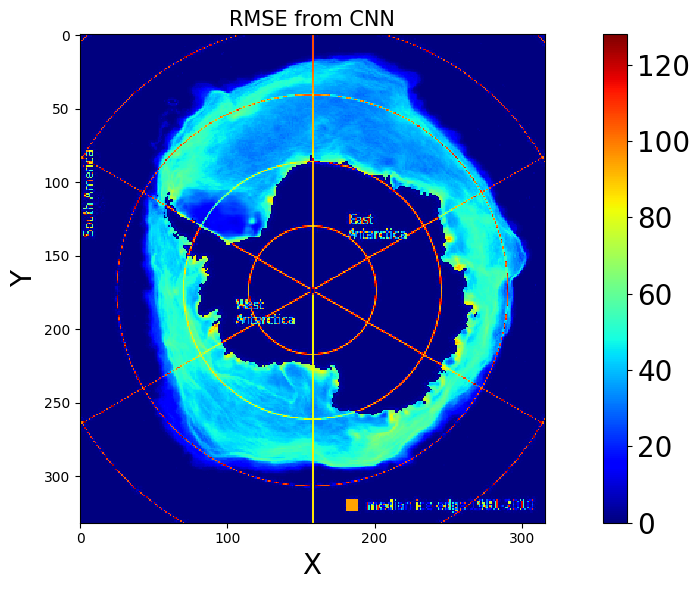

In [14]:


anomalies_grid = rmse_matrix




import matplotlib.pyplot as plt


import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.imshow(anomalies_grid, cmap='jet', interpolation='none')  # vmin set to 1 to leave 0 values as black

cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=20)
plt.title('RMSE from CNN',fontsize=15)
plt.xlabel('X', fontsize=20)
plt.ylabel('Y', fontsize=20)
plt.rc('xtick', labelsize=24)
plt.rc('ytick', labelsize=24) 


plt.tight_layout()
plt.savefig('rmse_jet' + '.png')

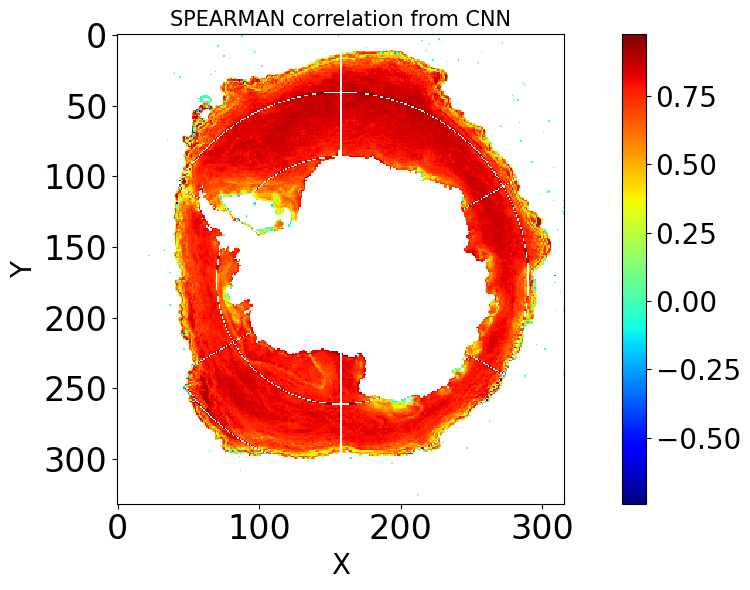

In [16]:

anomalies_grid = spearman_matrix




import matplotlib.pyplot as plt


import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.imshow(anomalies_grid, cmap='jet', interpolation='none')  # vmin set to 1 to leave 0 values as black

cbar = plt.colorbar()
cbar.ax.tick_params(labelsize=20)
plt.title('SPEARMAN correlation from CNN',fontsize=15)
plt.xlabel('X', fontsize=20)
plt.ylabel('Y', fontsize=20)
plt.rc('xtick', labelsize=24)
plt.rc('ytick', labelsize=24) 


plt.tight_layout()
plt.savefig('spearman_jet' + '.png')

In [10]:
import xarray as xr
import numpy as np

# Create a NumPy array
numpy_array = np.random.rand(3, 4, 5)

# Convert the NumPy array to xarray DataArray
xarray_data = xr.DataArray(numpy_array)

# Display the xarray DataArray
print(xarray_data)

obs,fct = xarray_data,xarray_data
r = xs.pearson_r(obs, fct)
print(r)

<xarray.DataArray (dim_0: 3, dim_1: 4, dim_2: 5)>
array([[[0.2338596 , 0.18922566, 0.622102  , 0.83866147, 0.46764162],
        [0.92754274, 0.83699345, 0.27953034, 0.58391561, 0.44695852],
        [0.31985761, 0.36240935, 0.88797982, 0.45120595, 0.61488162],
        [0.96214943, 0.49724643, 0.64901443, 0.81057432, 0.74883247]],

       [[0.34275327, 0.77826534, 0.19444981, 0.17977133, 0.65725705],
        [0.64821955, 0.49949574, 0.66376062, 0.05127985, 0.69441847],
        [0.70664146, 0.84468943, 0.38785322, 0.08894682, 0.92291897],
        [0.94383678, 0.6153592 , 0.0710451 , 0.18684481, 0.85562249]],

       [[0.99822024, 0.13086367, 0.25628433, 0.33038031, 0.35442609],
        [0.13250971, 0.3712762 , 0.41810567, 0.34639669, 0.68388106],
        [0.4911962 , 0.25208095, 0.76321202, 0.23708835, 0.93625172],
        [0.2793679 , 0.50882481, 0.32169425, 0.84203832, 0.23841364]]])
Dimensions without coordinates: dim_0, dim_1, dim_2
<xarray.DataArray ()>
array(1.)


In [11]:
# num_samples = 100
# selected_samples = range(num_samples)

# # Create a figure with 2 columns per sample
# num_columns = 4  # Adjusted to 4 columns to accommodate actual and predicted grids for each sample
# num_rows = int(np.ceil(num_samples / (num_columns / 2)))
# fig, axes = plt.subplots(num_rows, num_columns, figsize=(250, 250))

# for i, sample_index in enumerate(selected_samples):
#     # Plot actual grid on the left side
#     ax_actual = axes[i // (num_columns // 2), i % (num_columns // 2) * 2]
#     ax_actual.imshow(y_test_2d[sample_index], cmap='viridis')
#     ax_actual.set_title(f'Actual - Sample {sample_index}')
#     ax_actual.axis('off')

#     # Plot predicted grid on the right side
#     ax_pred = axes[i // (num_columns // 2), i % (num_columns // 2) * 2 + 1]
#     ax_pred.imshow(y_pred_2d[sample_index], cmap='viridis')
#     ax_pred.set_title(f'Predicted - Sample {sample_index}')
#     ax_pred.axis('off')

# plt.subplots_adjust(hspace=18)  # Adjust the value as needed

# plt.tight_layout()
# plt.show()



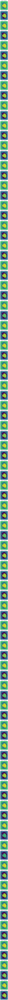

In [12]:
num_samples = 50  # Reduce the number of samples
selected_samples = range(num_samples)

# Reduce the individual subplot size
subplot_size = 10  # Adjust as needed
num_rows = num_samples * 2  # Two rows per sample
num_columns = 1
fig, axes = plt.subplots(num_rows, num_columns, figsize=(250, 250))

for i, sample_index in enumerate(selected_samples):
    # Plot actual grid
    ax_actual = axes[i * 2]
    ax_actual.imshow(y_test_2d[2000+sample_index], cmap='viridis')
    ax_actual.set_title(f'Actual - Sample {sample_index}')
    ax_actual.axis('off')

    # Plot predicted grid
    ax_pred = axes[i * 2+1]
    ax_pred.imshow(y_pred_2d[2000+sample_index], cmap='viridis')
    ax_pred.set_title(f'Predicted - Sample {sample_index}')
    ax_pred.axis('off')



plt.tight_layout()
plt.show()


In [13]:
import torch

print(torch.__version__)


2.0.1
